### T-Period Consumption-Saving Model with Labor Supply and Transitory Shocks

This code solves and simulates a finite-horizon $(T)$-period consumption-saving model with endogenous labor supply **and** i.i.d. transitory wage shocks. At each period $t = 1, \dots, T$, the agent chooses consumption $c_t$ and labor supply $\ell_t \in [0,1]$ to maximize lifetime utility. In contrast to the no-uncertainty case, wages now depend on a transitory shock $\varepsilon_t$, which modifies the budget constraint. The agent’s problem is:

$$
V_t(a_t) \;=\; \max_{c_t > 0, \,\ell_t \in [0,1]}
\Bigl\{
  \frac{c_t^{\,1-\rho}}{1-\rho}
  \;+\;
  \varphi \,\cdot \frac{\ell_t^{\,1-\eta}}{1-\eta}
  \;+\;
  \beta \,\mathbb{E}\bigl[V_{t+1}(a_{t+1})\bigr]
\Bigr\},
$$

$$
\text{s.t.}\quad a_{t+1}
\;=\;
(1+r)\,a_t
\;+\;
w_t(\varepsilon_t)\,\bigl(1 - \ell_t\bigr)
\;-\;
c_t,
$$

$$
a_t \;\ge\; 0
\quad (\text{No borrowing constraint}).
$$

---

### Model Parameter Settings

| **Parameter**       | **Value**               | **Description**                                                  |
|---------------------|-------------------------|------------------------------------------------------------------|
| `T`                 | 50                      | Number of periods                                                |
| `β (beta)`          | 0.97                    | Discount factor                                                  |
| `ρ (rho)`           | 1.5                     | Relative risk aversion (CRRA)                                    |
| `φ (phi)`           | 0.04                    | Weight on utility of leisure                                     |
| `η (eta)`           | 5.0                     | Curvature parameter for leisure utility                          |
| `α (alpha)`         | 0.08                    | Productivity factor (augmenting the wage with accumulated labor) |
| `w`                 | 100,000                 | Base wage rate (before shocks)                                   |
| `τ (tau)`           | 0.25                    | Labor income tax rate                                            |
| `r`                 | 0.03                    | Interest rate                                                    |
| `a_max`             | 1,000,000               | Maximum assets in the grid                                       |
| `a_min`             | 0                       | Minimum assets (no borrowing)                                    |
| `Na`                | 25                      | Number of asset grid points                                      |
| `k_max`             | 15.0                    | Maximum "capital" for labor efficiency                           |
| `Nk`                | 25                      | Number of labor grid points                                      |
| `Nt`                | 3                       | Number of shock grid points (for quadrature)                     |
| `sigma_eps`  | 0.3                     | Std. dev. of transitory lognormal wage shocks                    |
| `t_grid`            | Gauss-Hermite nodes      | Possible transitory shock values (lognormal)                     |
| `t_weight`          | Normalized G-H weights   | Probability weights for each shock node                          |

In each period, the agent’s *effective wage* is given by

$$
w_t(\varepsilon_t)
\;=\;
(1 - \tau)\,w\,\varepsilon_t
\;\Bigl[\,1 + \alpha\,(\text{Human Capital})\Bigr],
$$

reflecting both taxation $\tau$, transitory shocks $\varepsilon_t$, and productivity growth via past labor $(\alpha)$. The solution routine uses value function iteration over a 4-dimensional state space $(a,k,\varepsilon,t)$, and the simulation draws random shocks each period to track how consumption and labor adjust over time.

---

### Script Overview

1. **Nonlinear Grids**  
   - `nonlinspace` creates a curved grid for assets or labor.
   - `create_focused_grid` refines the asset grid near a focal point (e.g., mid-range assets).

2. **Model Definition**  
   - `ConSavLabor_stochastic` stores parameters, grids, arrays for the solution (`sol_c, sol_h, sol_v`), and simulation (`sim_a, sim_c, sim_h, …`), as well as the shock structure (`t_grid`, `t_weight`).

3. **Solver**  
   - `solve_model!` implements backward recursion, computing optimal consumption `c` and labor `h` for each state $(a,k,\varepsilon)$.  
   - The final period is a simpler one-step optimization, while earlier periods use nested optimization to account for future value.

4. **Simulation**  
   - `simulate_model!` uses the solved policy rules to simulate paths for assets, labor, and consumption for `simN` agents over `simT` periods.  
   - Each period, a transitory shock $\varepsilon_t$ is drawn from the shock grid, updating wages and decisions accordingly.

By introducing transitory wage shocks, this framework captures short-term fluctuations in income and labor supply while still modeling the long-run savings and labor trade-offs over a finite horizon.

### Setup

In [2]:
using Random, NLopt, LinearAlgebra, Interpolations, Roots, FastGaussQuadrature
using Plots, Statistics, ProgressMeter, ForwardDiff, Distributions, Measures, StatsBase 

### Model

In [3]:

# -------------------------------
# Utility: Nonlinear Grid Creator
# -------------------------------
function nonlinspace(start::Float64, stop::Float64, num::Int, curv::Float64)
    lin_vals = range(0, stop=1, length=num)
    curved_vals = lin_vals .^ curv
    return start .+ (stop - start) .* curved_vals
end

function create_focused_grid(a_min::Float64, a_focus::Float64, a_max::Float64, Na::Int, focus_share::Float64, curv::Float64)
    Na_focus = ceil(Int, Na * focus_share)
    Na_rest = Na - Na_focus
    grid_focus = nonlinspace(a_min, a_focus, Na_focus, curv)
    grid_rest = nonlinspace(a_focus, a_max, Na_rest + 1, curv)[2:end]
    return vcat(grid_focus, grid_rest)
end

# -------------------------------
# Dynamic Labor Model Definition
# -------------------------------
mutable struct ConSavLabor_stochastic
    T::Int                        # Time periods
    rho::Float64                 # Risk aversion (CRRA)
    beta::Float64                # Discount factor
    phi::Float64                 # Weight on labor disutility
    eta::Float64                 # Frisch elasticity parameter
    alpha::Float64               # Productivity or returns to labor
    w::Float64                   # Base wage rate
    y::Float64                   # Non-labor income
    tau::Float64                 # Labor income tax
    r::Float64                   # Interest rate
    a_max::Float64               # Max asset level
    a_min::Float64               # Min asset level
    Na::Int                      # Number of asset grid points
    k_max::Float64               # Max labor effort
    Nk::Int                      # Number of labor grid points
    simT::Int                    # Simulation time periods
    simN::Int                    # Number of simulated agents
    a_grid::Vector{Float64}      # Asset grid
    k_grid::Vector{Float64}      # Labor grid

    Nt::Int                      # Number of grid points for t
    t_grid::Vector{Float64}      # Grid for transitory shock t
    sigma_eps::Float64           # Std dev of transitory shock
    t_weight::Vector{Float64}    # Weights for t quadrature

    sol_c::Array{Float64,4}      # Optimal consumption [T, Na, Nk, Nt]
    sol_h::Array{Float64,4}      # Optimal labor effort [T, Na, Nk, Nt]
    sol_v::Array{Float64,4}      # Value function [T, Na, Nk, Nt]
    
    sim_c::Array{Float64,2}      # Simulated consumption [simN, simT]
    sim_h::Array{Float64,2}      # Simulated labor [simN, simT]
    sim_a::Array{Float64,2}      # Simulated assets [simN, simT]
    sim_k::Array{Float64,2}      # Simulated labor choice [simN, simT]
    sim_t::Array{Float64,2}      # Simulated transitory shock [simN, simT]
    sim_a_init::Vector{Float64}  # Initial assets
    sim_k_init::Vector{Float64}  # Initial labor effort
    sim_w_eff::Array{Float64,2}  # Effective wage for simulation [simN, simT]

    
    draws_uniform::Array{Float64,2}  # Uniform draws for simulation [simN, simT]
    w_vec::Vector{Float64}       # Time-varying wage vector [T]
end

# -------------------------------
# Constructor for ConSavLabor
# -------------------------------
function ConSavLabor_stochastic(; T::Int=50, beta::Float64=0.97, rho::Float64=1.5,
                     y::Float64=30000.0,r::Float64=0.03, a_max::Float64=1000000.0,
                     Na::Int=25, simN::Int=5000, a_min::Float64=0.0, k_max::Float64=15.0,
                     Nk::Int=25, w::Float64=100000.0, tau::Float64=0.25,
                     eta::Float64=5.0, alpha::Float64=0.08,
                     phi::Float64=0.04, seed::Int=1234,
                     sigma_eps::Float64=0.3, Nt::Int=3)
    simT = T
    a_grid = create_focused_grid(a_min, 500000.0, a_max, Na, 0.9, 1.1)
    k_grid = nonlinspace(0.0, k_max, Nk, 1.5)

    # Gauss-Hermite quadrature for shocks
    # Gauss-Hermite quadrature for epsilon ~ N(0,1)
    nodes, weights = gausshermite(Nt)
    # Define shock grid for log-normal distribution
    mu = -0.5 * sigma_eps^2  # Ensures E[t_shock] = 1
    t_grid = exp.(mu .+ sigma_eps .* nodes)  # t_shock = exp(epsilon), epsilon ~ N(mu, sigma_eps^2)
    t_weight = weights / sum(weights)  # Normalize weights to sum to 1

    # Solution storage
    sol_shape = (T, Na, Nk, Nt)  
    sol_c = fill(NaN, sol_shape)   # Now 4D to include shocks
    sol_h = fill(NaN, sol_shape)
    sol_v = fill(NaN, sol_shape)  # Value function is expected value, so still 3D

    # Simulation storage
    sim_shape = (simN, simT)
    sim_c = fill(NaN, sim_shape)
    sim_h = fill(NaN, sim_shape)
    sim_a = fill(NaN, sim_shape)
    sim_k = fill(NaN, sim_shape)
    sim_t = fill(NaN, sim_shape)
    sim_w_eff = fill(NaN, sim_shape)  # Effective wage for simulation

    # Random draws
    rng = MersenneTwister(seed)
    draws_uniform = rand(rng, sim_shape...)

    # Initial conditions
    sim_a_init = zeros(Float64, simN)
    sim_k_init = zeros(Float64, simN)


    # Wage vector
    w_vec = fill(w, T)

    return ConSavLabor_stochastic(T, rho, beta, phi, eta, alpha, w, y, tau, r,
                       a_max, a_min, Na, k_max, Nk, simT, simN,
                       a_grid, k_grid,
                       Nt, t_grid, sigma_eps, t_weight,
                       sol_c, sol_h, sol_v,
                       sim_c, sim_h, sim_a, sim_k, sim_t,
                       sim_a_init, sim_k_init, sim_w_eff,
                       draws_uniform, w_vec)
end

# --------------------------
# Model Solver
# --------------------------

function solve_model!(model::ConSavLabor_stochastic)
    T, Na, Nk, Nt = model.T, model.Na, model.Nk, model.Nt
    a_grid, k_grid, t_grid = model.a_grid, model.k_grid, model.t_grid
    sol_c, sol_h, sol_v = model.sol_c, model.sol_h, model.sol_v

    # **Final Period (t = T)**
    for i_a in 1:Na
        for i_k in 1:Nk
            for i_t in 1:Nt
                assets = a_grid[i_a]
                capital = k_grid[i_k]
                t_shock = t_grid[i_t]
                
                function obj_last(h_vec::Vector, grad::Vector)
                    h = h_vec[1]
                    return obj_last_period(model, h, assets, capital, T, t_shock)
                end
                
                opt = Opt(:LN_BOBYQA, 1)
                lower_bounds!(opt, [0.0])    # Hours between 0 and 1
                upper_bounds!(opt, [1.0])
                ftol_rel!(opt, 1e-6)         # Relative tolerance
                min_objective!(opt, obj_last)
                init = [0.5]                 # Initial guess for hours
                (minf, h_vec, ret) = optimize(opt, init)
                
                h_opt = h_vec[1]
                w_eff = wage_func(model, capital, T, t_shock)
                cons = assets + w_eff * h_opt
                
                sol_h[T, i_a, i_k, i_t] = h_opt
                sol_c[T, i_a, i_k, i_t] = cons
                sol_v[T, i_a, i_k, i_t] = -minf  # Store positive utility
            end
        end
    end

    # **Earlier Periods (t = T-1 to 1)**
    @showprogress 1 "Solving working model..." for t in (T-1):-1:1
        interp = create_interp(model, sol_v, t + 1)
        for i_a in 1:Na
            for i_k in 1:Nk
                for i_t in 1:Nt
                    assets = a_grid[i_a]
                    capital = k_grid[i_k]
                    t_shock = t_grid[i_t]
                    
                    # Objective for earlier periods (c and h choice)
                    function obj_work(x::Vector, grad::Vector)
                        c, h = x[1], x[2]
                        return -value_of_work_choice(model, c, h, assets, capital, t, t_shock, interp)
                    end
                    
                    opt = Opt(:LN_BOBYQA, 2)
                    lower_bounds!(opt, [0.0, 0.0])
                    upper_bounds!(opt, [Inf, 1.0])
                    ftol_rel!(opt, 1e-6)
                    min_objective!(opt, obj_work)
                    init = [sol_c[t + 1, i_a, i_k, i_t], sol_h[t + 1, i_a, i_k, i_t]]
                    (minf, x_opt, ret) = optimize(opt, init)
                    
                    sol_c[t, i_a, i_k, i_t] = x_opt[1]
                    sol_h[t, i_a, i_k, i_t] = x_opt[2]
                    sol_v[t, i_a, i_k, i_t] = -minf
                end
            end
        end
    end
    return model
end

# -------------------------------
# Separate Objective Function
# -------------------------------
function value_of_work_choice(model::ConSavLabor_stochastic, c::Float64, h::Float64, assets::Float64,
    capital::Float64, t::Int, t_shock::Float64, interp::Vector)
    # Penalties for constraint violations
    penalty_c = c < 0.0 ? (abs(c)^2) * 1.0e7 : 0.0
    penalty_h = h < 0.0 ? (abs(h)^2) * 10e7 : 0.0

    # Next period assets
    w_eff = wage_func(model, capital, t, t_shock)
    a_next = (1.0 + model.r) * assets + w_eff * h - c
    penalty_a = a_next < model.a_min ? ((model.a_min - a_next)^2) * 1.0e12 : 0.0

    # Next period capital
    k_next = capital + h

    # Expected future value using quadrature
    V_next = sum(model.t_weight[j] * interp[j](a_next, k_next) for j in 1:model.Nt)

    # Current utility
    util_now = util(model, c, h)
    # Total value
    return util_now + model.beta * V_next - penalty_c - penalty_h - penalty_a
end

function obj_last_period(model::ConSavLabor_stochastic, h::Float64, assets::Float64,
                        capital::Float64, t::Int, t_shock::Float64)

    w_eff = wage_func(model, capital, t, t_shock)  # Effective wage with shock
    cons = assets + w_eff * h                      # Consumption = assets + labor income
    return -util(model, cons, h)                   # Negative utility (for minimization)
end

# -------------------------------
# Supporting Functions
# -------------------------------
@inline function util(model::ConSavLabor_stochastic, c::Float64, h::Float64)
    l = 1.0 - h  # Leisure
    return (c^(1.0 - model.rho)) / (1.0 - model.rho) + model.phi * (l^(1.0 - model.eta)) / (1.0 - model.eta)
end

@inline function wage_func(model::ConSavLabor_stochastic, capital::Float64, t::Int, t_shock::Float64)
    return (1.0 - model.tau) * model.w_vec[t] * t_shock * (1.0 + model.alpha * capital)
end

function create_interp(model::ConSavLabor_stochastic, sol_v::Array{Float64,4}, t::Int)
    return [LinearInterpolation((model.a_grid, model.k_grid), sol_v[t, :, :, i_t], extrapolation_bc=Line()) for i_t in 1:model.Nt]
end

# --------------------------
# Simulation
# --------------------------
function simulate_model!(model::ConSavLabor_stochastic)
    simN, simT = model.simN, model.simT
    sim_a, sim_k, sim_t, sim_w_eff = model.sim_a, model.sim_k, model.sim_t , model.sim_w_eff
    sim_c, sim_h = model.sim_c, model.sim_h
    draws_uniform = model.draws_uniform

    # Precompute interpolation objects for each period and shock
    interp_dict = Dict()
    for t in 1:simT, i_t in 1:model.Nt
        sol_c_slice = model.sol_c[t, :, :, i_t]  # 4D array: (T, Na, Nk, Nt)
        sol_h_slice = model.sol_h[t, :, :, i_t]
        interp_dict[(t, i_t, :c)] = LinearInterpolation((model.a_grid, model.k_grid), sol_c_slice, extrapolation_bc=Line())
        interp_dict[(t, i_t, :h)] = LinearInterpolation((model.a_grid, model.k_grid), sol_h_slice, extrapolation_bc=Line())
    end

    # Initialize simulation
    for i in 1:simN
        sim_a[i, 1] = model.sim_a_init[i]  # Initial assets
        sim_k[i, 1] = model.sim_k_init[i]  # Initial capital
        sim_t[i, 1] = 0.0                  # Initial shock (e.g., zero)
    end

    # Simulation loop
    for i in 1:simN
        for t in 1:simT
            # Draw shock index using uniform draws and cumulative weights
            cum_weights = cumsum(model.t_weight)
            u = draws_uniform[i, t]
            i_t = findfirst(u .<= cum_weights)  # Select shock index
            sim_t[i, t] = model.t_grid[i_t]     # Realized shock

            # Apply policy functions for the realized shock
            interp_c = interp_dict[(t, i_t, :c)]
            interp_h = interp_dict[(t, i_t, :h)]
            sim_c[i, t] = interp_c(sim_a[i, t], sim_k[i, t])
            sim_h[i, t] = interp_h(sim_a[i, t], sim_k[i, t])
            sim_h[i, t] = clamp(sim_h[i, t], 0.0, 1.0)  # Hours in [0, 1]
            sim_w_eff[i, t] = wage_func(model, model.sim_k[i, t], t, model.sim_t[i, t])

            # Update next period’s states (if not the last period)
            if t < simT
                w_eff = wage_func(model, sim_k[i, t], t, sim_t[i, t])
                income = w_eff * sim_h[i, t]
                sim_a[i, t+1] = (1 + model.r) * sim_a[i, t] + income - sim_c[i, t]
                sim_k[i, t+1] = sim_k[i, t] + sim_h[i, t]
            end
        end
    end
end

simulate_model! (generic function with 1 method)

### Model and Counterfactual Simulation in a T-Period 
This script solves and simulates a finite-horizon (T-period) consumption-saving model under different economic scenarios. It compares a baseline model with four counterfactual experiments, focusing on how each setting affects average consumption and asset accumulation over time.


In [4]:
# ============================
# Baseline and Counterfactuals
# ============================

# -- Baseline Model (Default Parameters) --
model_baseline = ConSavLabor_stochastic(Na=25)
solve_model!(model_baseline)
simulate_model!(model_baseline)

# ----------------------------------------
# Counterfactual 1: Tax Rate Variations
# ----------------------------------------

# Lower tax rate (τ = 10%)
model_low_tax = ConSavLabor_stochastic(tau = 0.10)
solve_model!(model_low_tax)
simulate_model!(model_low_tax)

# Higher tax rate (τ = 30%)
model_high_tax = ConSavLabor_stochastic(tau = 0.30)
solve_model!(model_high_tax)
simulate_model!(model_high_tax)

# ----------------------------------------
# Counterfactual 2: Wage Variations
# ----------------------------------------

# Higher wage level (w = 150,000)
model_high_wage = ConSavLabor_stochastic(w = 150000.0)
solve_model!(model_high_wage)
simulate_model!(model_high_wage)

# ----------------------------------------
# Counterfactual 3: Time Preference (Discount Factor β)
# ----------------------------------------

# More impatient agent (β = 0.96)
model_low_beta = ConSavLabor_stochastic(beta = 0.96)
solve_model!(model_low_beta)
simulate_model!(model_low_beta)

# More patient agent (β = 0.98)
model_high_beta = ConSavLabor_stochastic(beta = 0.98)
solve_model!(model_high_beta)
simulate_model!(model_high_beta)

# ----------------------------------------
# Counterfactual 4: Frisch Elasticity (η)
# ----------------------------------------

# Higher Frisch elasticity (η = 3.0 → more responsive labor supply)
model_high_fe = ConSavLabor_stochastic(eta = 3.0)
solve_model!(model_high_fe)
simulate_model!(model_high_fe)

# Lower Frisch elasticity (η = 7.0 → less responsive labor supply)
model_low_fe = ConSavLabor_stochastic(eta = 7.0)
solve_model!(model_low_fe)
simulate_model!(model_low_fe)

# ----------------------------------------
# Counterfactual 5: Initial Assets from Lognormal Distribution
# ----------------------------------------

# Assign initial assets from a LogNormal distribution with ~90% falling between $5k and $20k
μ = 9.4
σ = 0.45

model_lognormal = ConSavLabor_stochastic()
model_lognormal.sim_a_init .= rand(LogNormal(μ, σ), model_lognormal.simN)
solve_model!(model_lognormal)
simulate_model!(model_lognormal)

# ----------------------------------------
# Counterfactual 6: Retirement Income Reduction
# ----------------------------------------

# Assume wage = 0.7*w after period 40 (e.g., partial retirement)
model_retirement = ConSavLabor_stochastic()
model_retirement.w_vec[1:40] .= model_retirement.w
model_retirement.w_vec[40:end] .= 0.7 * model_retirement.w
solve_model!(model_retirement)
simulate_model!(model_retirement)

# ----------------------------------------
# Counterfactual 7: Interest Rate Variations (r)
# ----------------------------------------

# Lower interest rate (r = 1%)
model_low_r = ConSavLabor_stochastic(r = 0.01)
solve_model!(model_low_r)
simulate_model!(model_low_r)

# Higher interest rate (r = 5%)
model_high_r = ConSavLabor_stochastic(r = 0.05)
solve_model!(model_high_r)
simulate_model!(model_high_r)

### Model Structure and Policy Function Visualization

- **Asset Grid (Top-left):**  
  Displays the nonlinear asset grid, with denser points at low asset levels.

- **Terminal Value Function (Top-right):**  
Depicts the value function at \(T = 50\), representing lifetime utility as a function of assets.

- **Terminal Consumption Policy (Middle-left):**  
  Shows optimal consumption at the terminal period (\(T = 50\)), where agents consume all available resources.

- **Early Consumption Policy (Middle-right):**  
  Illustrates optimal consumption at an earlier period (\(T = 10\)), reflecting saving behavior.

- **Early Labor Policy (Bottom-left):**  
  Displays optimal labor supply at \(T = 10\).

- **Terminal Labor Policy (Bottom-right):**  
  Shows optimal labor supply at \(T = 50\).

This layout clarifies how the asset grid design and time dynamics shape optimal consumption and labor decisions.

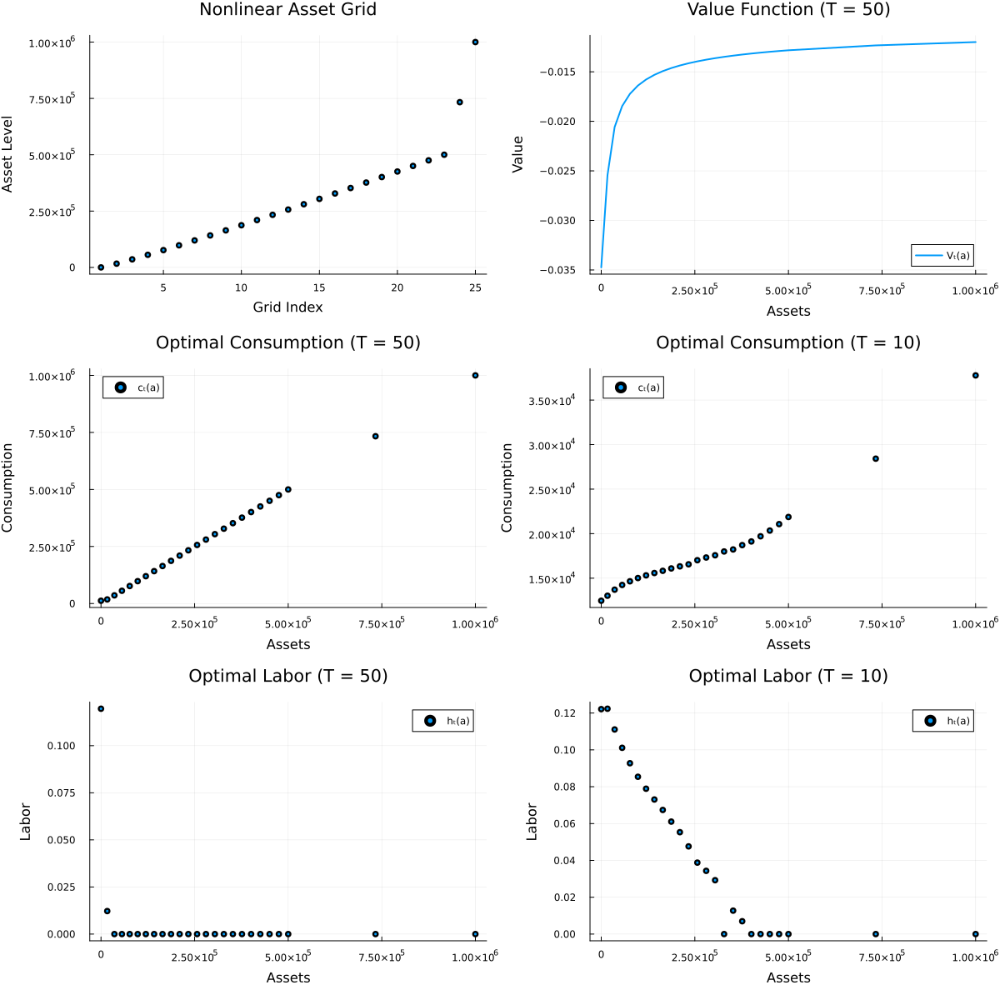

In [29]:

# Choose a representative labor grid index (e.g. the median)
k_mid = Int(ceil(length(model_baseline.k_grid)/2))
t_mid = Int(ceil(length(model_baseline.t_grid)/2))
T_terminal = model_baseline.T  # Terminal period (e.g., 50)
t_early = 10          # An earlier period for comparison

# 1. Plot the nonlinear asset grid
p1 = scatter(1:length(model_baseline.a_grid), model_baseline.a_grid,
    xlabel = "Grid Index",
    ylabel = "Asset Level",
    title = "Nonlinear Asset Grid",
    legend = false,
    markersize = 3)

# 2. Plot optimal consumption policy at terminal period (T = model.T)
# Here we fix the labor dimension at k_mid.
p2 = scatter(model_baseline.a_grid, model_baseline.sol_c[T_terminal, :, k_mid, t_mid],
    xlabel = "Assets",
    ylabel = "Consumption",
    title = "Optimal Consumption (T = $(T_terminal))",
    label = "cₜ(a)",
    markersize = 3)

# 3. Plot value function at terminal period (T = model.T)
# Note: use 'sol_v' (not sol_V) as per your definition.
p3 = plot(model_baseline.a_grid, model_baseline.sol_v[T_terminal, :, k_mid, t_mid],
    xlabel = "Assets",
    ylabel = "Value",
    title = "Value Function (T = $(T_terminal))",
    label = "Vₜ(a)",
    linewidth = 2)

# 4. Plot optimal consumption policy at an earlier period (e.g., T = 10)
p4 = scatter(model_baseline.a_grid, model_baseline.sol_c[t_early, :, k_mid, t_mid],
    xlabel = "Assets",
    ylabel = "Consumption",
    title = "Optimal Consumption (T = $(t_early))",
    label = "cₜ(a)",
    markersize = 3)

p5 = scatter(model_baseline.a_grid, model_baseline.sol_h[t_early, :, k_mid, t_mid],
    xlabel = "Assets",
    ylabel = "Labor",
    title = "Optimal Labor (T = $(t_early))",
    label = "hₜ(a)",
    markersize = 3)

p6 = scatter(model_baseline.a_grid, model_baseline.sol_h[T_terminal, :, k_mid, t_mid],
    xlabel = "Assets",
    ylabel = "Labor",
    title = "Optimal Labor (T = $(T_terminal))",
    label = "hₜ(a)",
    markersize = 3)

# Combine all plots into a 2×2 grid layout for comparison
plot(p1, p3, p2, p4, p6, p5, layout = (3, 2), size = (1200, 1200), margin=2mm)

### Average Wage and Income Over Time 
This script calculates the average wage and income at each time step from the simulation model (`model_baseline`). It then plots these two time series side by side to facilitate a direct comparison of wage and income trends over the simulation horizon.

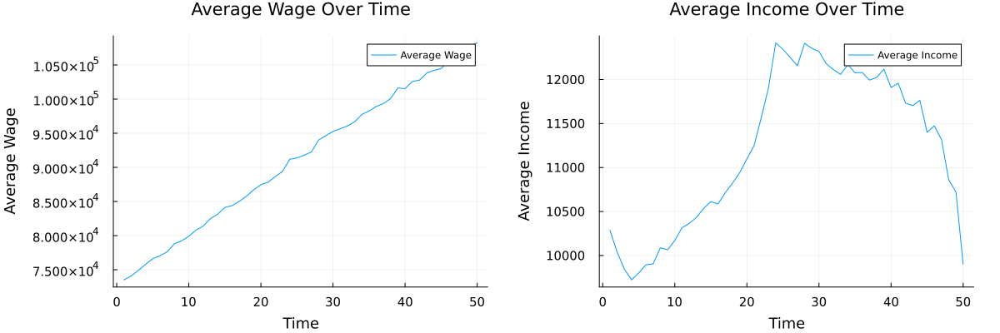

In [6]:
# Calculate average wage over time
avg_wage_over_time = [mean(model_baseline.sim_w_eff[:, t]) for t in 1:model_baseline.simT]

# Calculate average income over time
sim_income = model_baseline.sim_w_eff .* model_baseline.sim_h
avg_income_over_time = [mean(sim_income[:, t]) for t in 1:model_baseline.simT]

# Create the two plots with improved font and layout settings
p_avg_wage = plot(1:model_baseline.simT, avg_wage_over_time, 
                  label="Average Wage", 
                  title="Average Wage Over Time", 
                  xlabel="Time", 
                  ylabel="Average Wage",
                  legend=:topright,
                  guidefontsize=12,
                  tickfontsize=10)

p_avg_income = plot(1:model_baseline.simT, avg_income_over_time, 
                    label="Average Income", 
                    title="Average Income Over Time", 
                    xlabel="Time", 
                    ylabel="Average Income",
                    legend=:topright,
                    guidefontsize=12,
                    tickfontsize=10)

# Display them side by side with margin fixes
plot(p_avg_wage, p_avg_income, layout=(1, 2), size=(1200, 400), margin=6mm)

### Variable Distribution Comparison Over Time 
This script defines a function that plots the distributions of a given variable (e.g., Assets, Hours, Wages, Consumption) at selected time periods. It creates uniform histograms with consistent x‑ and y‑axis limits and arranges them in a 2×2 grid using a colorful, enhanced visualization style for direct comparison.

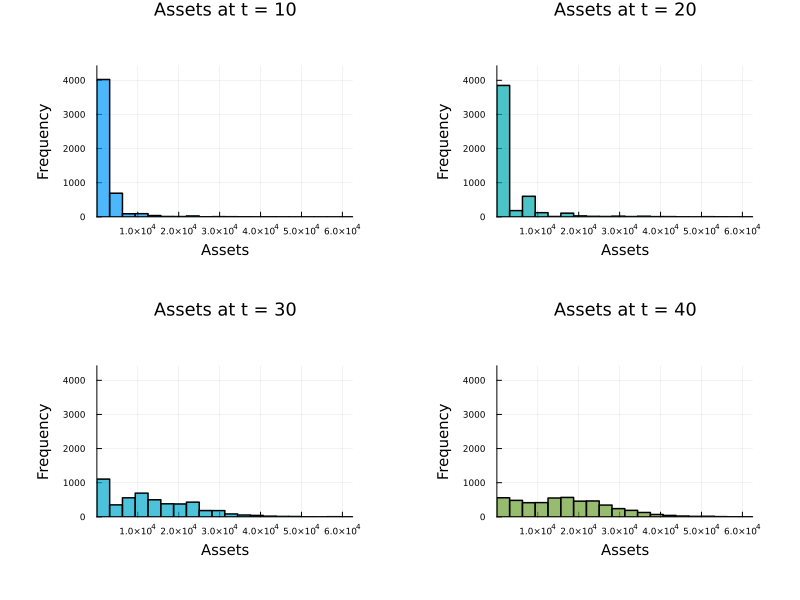

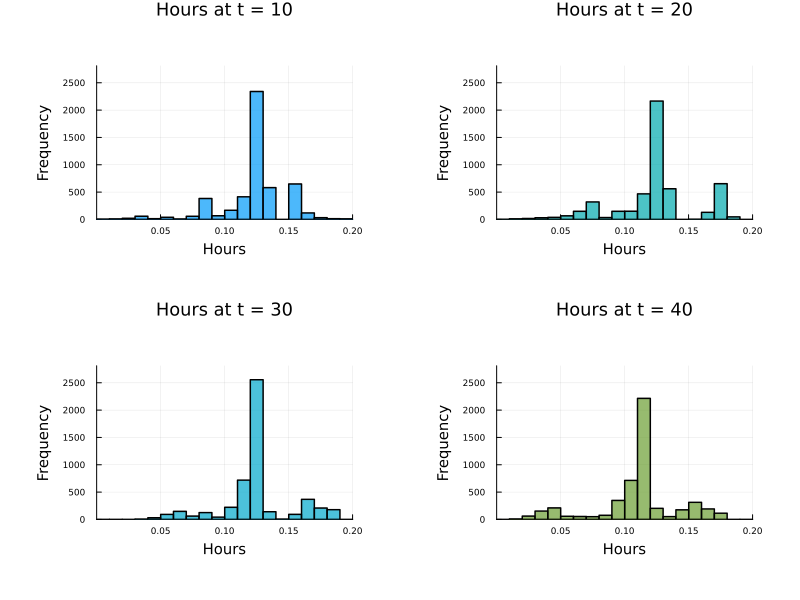

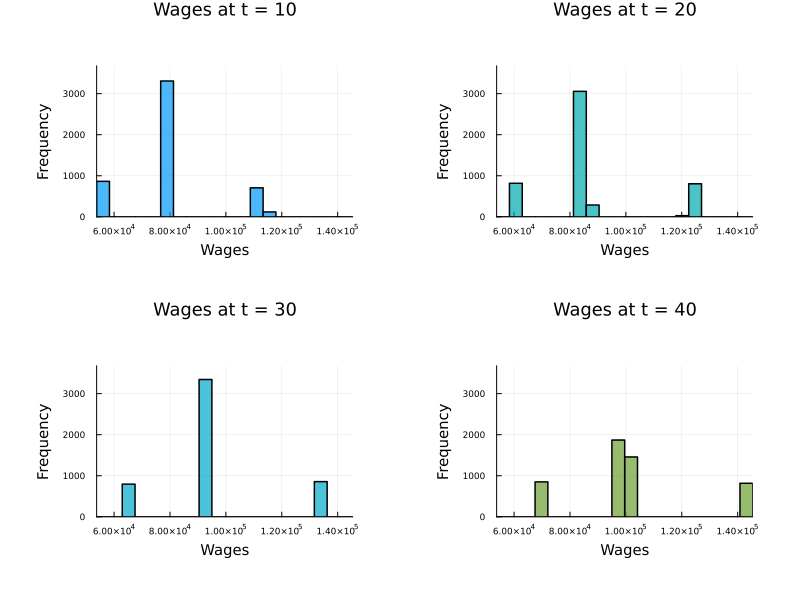

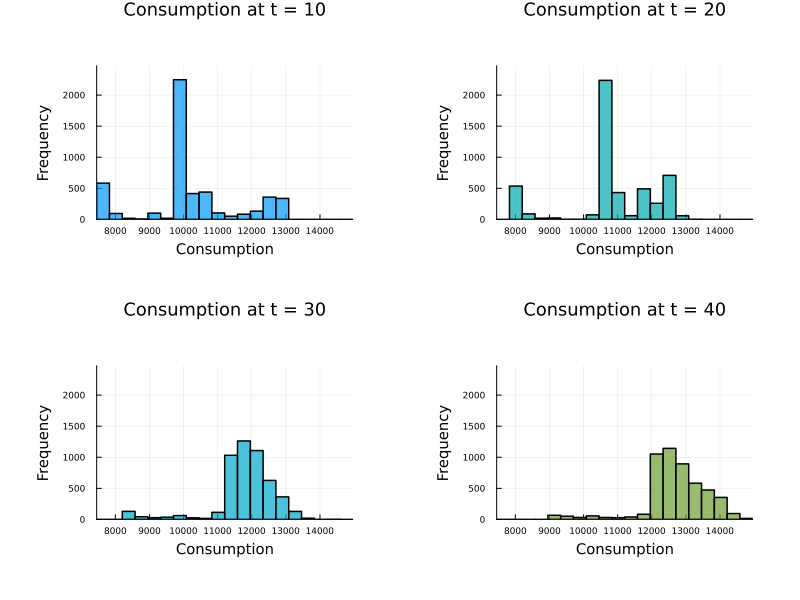

In [36]:
function plot_variable_by_time(var_matrix, time_steps, var_name)
    # Gather all the data from the selected time periods to obtain global x-axis limits.
    all_data = vcat([var_matrix[:, t] for t in time_steps]...)
    global_min = minimum(all_data)
    global_max = maximum(all_data)
    xlims_var = (global_min, global_max)
    
    # Build uniform bins (25 bins yields 26 edges)
    bin_edges = range(global_min, stop=global_max, length=21)
    bins = collect(bin_edges)
    
    # Determine the global maximum count using the same bins
    max_count = 0
    for t in time_steps
        h = fit(Histogram, var_matrix[:, t], bins)
        max_count = max(maximum(h.weights), max_count)
    end
    ylims_var = (0, max_count * 1.1)   # add a 10% margin
    
    # Define a colorful palette (using the Set1 palette from Plots.jl, which gives 4 bright colors)
    mycolors = palette(:auto, 4)
    
    # Create enhanced histograms with a consistent style
    p_list = [ histogram(var_matrix[:, t],
                bins=bins,
                title="$var_name at t = $t",
                xlabel=var_name,
                ylabel="Frequency",
                xlims=xlims_var,
                ylims=ylims_var,
                label="",
                color=mycolors[i],
                linecolor=:black,
                linewidth=1.5,
                fillalpha=0.7,
                grid=true,
                guidefontsize=10,
                tickfontsize=6,
                titlefontsize=12)
               for (i, t) in enumerate(time_steps) ]
    
    # Combine the subplots into a 2x2 grid with margins and a white background.
    p_combined = plot(p_list..., layout=(2, 2), size=(800, 600), margin=10mm, background_color=:white)
    return p_combined
end

# Example usage:
time_steps = [10, 20, 30, 40]

# To plot Assets across the specified years with comparable scales:
p_assets = plot_variable_by_time(model_baseline.sim_a, time_steps, "Assets")
display(p_assets)

# And similarly, you can plot the other variables:
p_hours = plot_variable_by_time(model_baseline.sim_h, time_steps, "Hours")
display(p_hours)

p_wages = plot_variable_by_time(model_baseline.sim_w_eff, time_steps, "Wages")
display(p_wages)

p_consumption = plot_variable_by_time(model_baseline.sim_c, time_steps, "Consumption")

###  Counterfactual Analysis
We investigate the effects of key economic parameters on individual consumption, savings, labor effort, and human capital accumulation. Our **baseline model** is defined as follows:

In [8]:
t = 1:model_baseline.simT

# Helper function to compute average path over agents
function avg_sim(var)
    return vec(mean(var, dims=1))
end

# Extract averages for all simulated variables
function extract_all(model)
    return (
        c = avg_sim(model.sim_c),
        a = avg_sim(model.sim_a),
        h = avg_sim(model.sim_h),
        k = avg_sim(model.sim_k)
    )
end


extract_all (generic function with 1 method)

##### Counterfactual 1: **Tax Rate Variations**

We vary the labor income tax rate to examine its impact on work incentives and savings behavior.

- **Baseline:** τ = 0.25
- **Low Tax:** τ = 0.10
- **High Tax:** τ = 0.30 

> 💡 **Interpretation:**  
> Lower taxes increase disposable income, which leads to higher consumption and more asset accumulation. Higher taxes reduce both, while increasing labor disincentives.


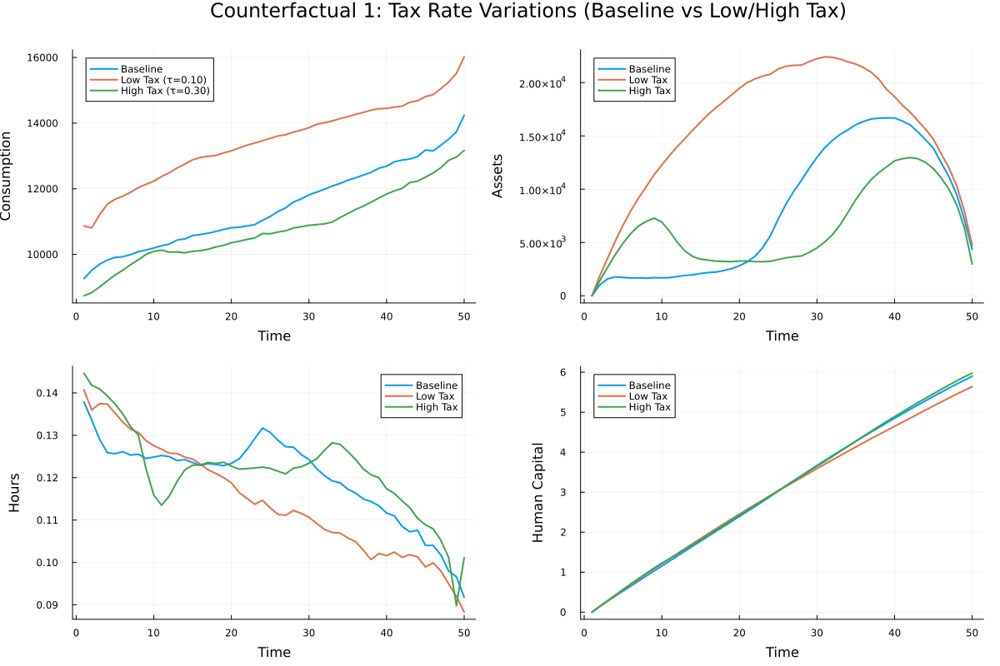

In [38]:
# ----------------------------------------------
# 1. Tax Rate Variations (Low and High Tax)
# ----------------------------------------------
# Baseline averages
base = extract_all(model_baseline);
low_tax = extract_all(model_low_tax)
high_tax = extract_all(model_high_tax)

p1 = plot(t, base.c, label="Baseline", lw=2, xlabel="Time", ylabel="Consumption")
plot!(t, low_tax.c, label="Low Tax (τ=0.10)", lw=2)
plot!(t, high_tax.c, label="High Tax (τ=0.30)", lw=2)

p2 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets")
plot!(t, low_tax.a, label="Low Tax", lw=2)
plot!(t, high_tax.a, label="High Tax", lw=2)

p3 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours")
plot!(t, low_tax.h, label="Low Tax", lw=2)
plot!(t, high_tax.h, label="High Tax", lw=2)

p4 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(t, low_tax.k, label="Low Tax", lw=2)
plot!(t, high_tax.k, label="High Tax", lw=2)

# Combine and add ONE title
plot(p1, p2, p3, p4,
     layout = (2, 2),
     size = (1200, 800),
     plot_title = "Counterfactual 1: Tax Rate Variations (Baseline vs Low/High Tax)",
     titlefont = 16, margin=3mm)

##### Counterfactual 2: **Wage Variations**

We increase the wage rate to study the response in labor effort, income, and savings.

- **Baseline:** w = 100,000  
- **High Wage:** w = 150,000  

> 💡 **Interpretation:**  
> A higher wage raises labor income and thus consumption and wealth, with little change in hours worked due to offsetting income and substitution effects.

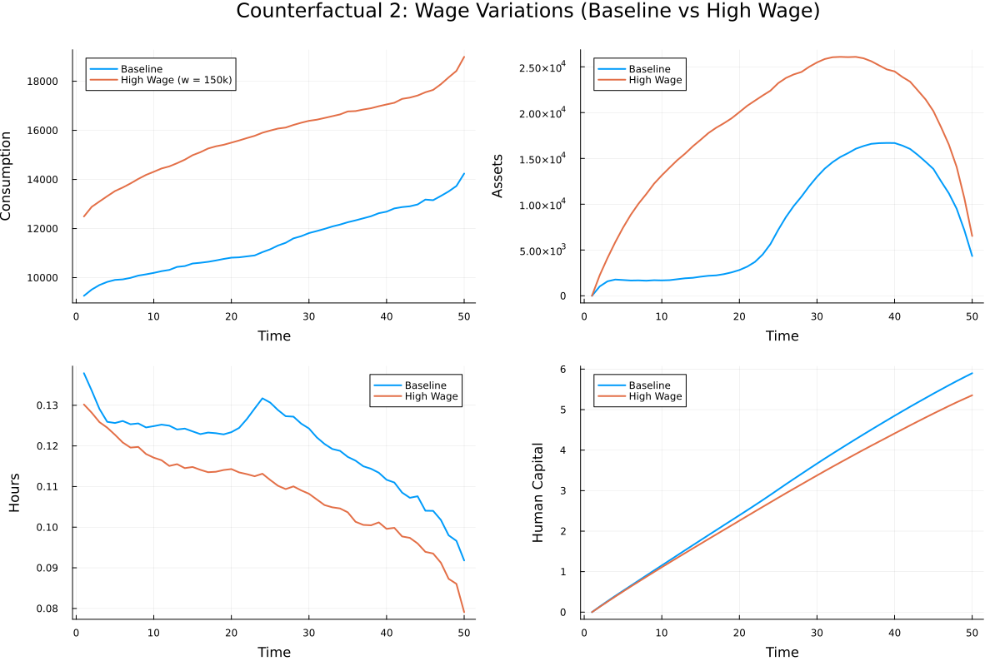

In [39]:
# ----------------------------------------------
# 2. Wage Variations (Baseline vs High Wage)
# ----------------------------------------------
high_wage = extract_all(model_high_wage)

p5 = plot(t, base.c, label="Baseline", lw=2, xlabel="Time", ylabel="Consumption")
plot!(t, high_wage.c, label="High Wage (w = 150k)", lw=2)

p6 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets")
plot!(t, high_wage.a, label="High Wage", lw=2)

p7 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours")
plot!(t, high_wage.h, label="High Wage", lw=2)

p8 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(t, high_wage.k, label="High Wage", lw=2)

plot(p5, p6, p7, p8,
     layout = (2, 2),
     size = (1200, 800),
     plot_title = "Counterfactual 2: Wage Variations (Baseline vs High Wage)",
     titlefont = 16, margin=3mm)

##### Counterfactual 3: **Discount Factor Variations (Time Preference)**

We vary the discount factor $ \beta $ to analyze how patience affects consumption, savings, and labor supply behavior over the life cycle.

- **Baseline:** $ \beta = 0.97 $  
- **Low Beta:** $ \beta = 0.96 $ (more impatient)  
- **High Beta:** $ \beta = 0.98 $ (more patient)

> 💡 **Interpretation:**  
> A **lower $\beta$** leads to more present-oriented behavior—individuals **consume more early on**, **save less**, and **work more** to fund current consumption.  
> A **higher $\beta$** implies stronger future orientation—people **defer consumption**, **save more**, and **may work less** due to greater accumulated wealth.



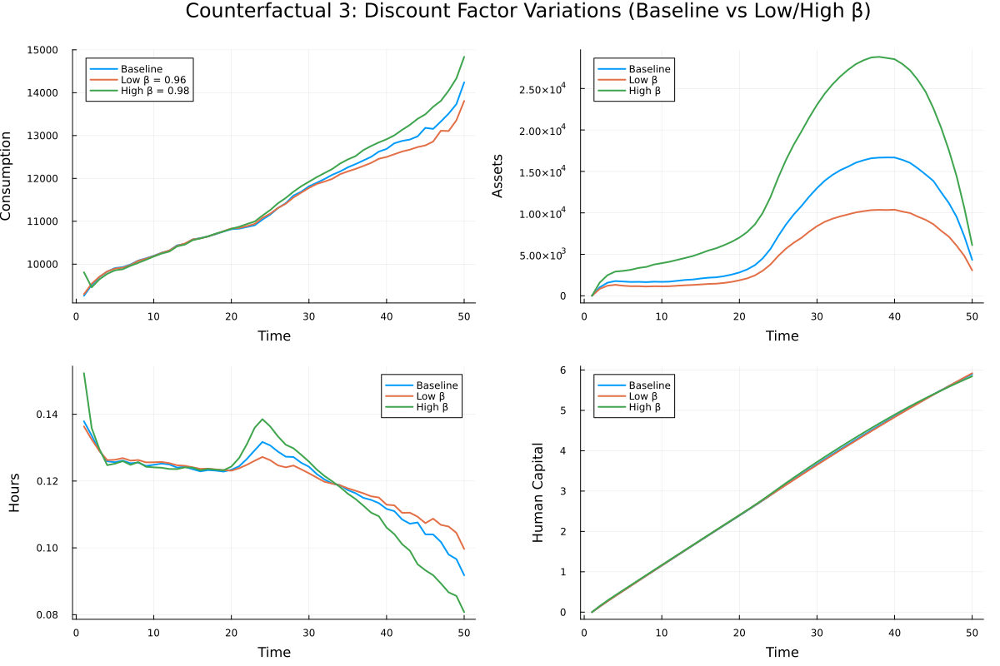

In [40]:
# ----------------------------------------------
# 3. Discount Factor Variations (Low and High β)
# ----------------------------------------------

# Extract simulated series
low_beta  = extract_all(model_low_beta)
high_beta = extract_all(model_high_beta)

# Plot: Consumption
pβ1 = plot(t, base.c, label="Baseline", lw=2, xlabel="Time", ylabel="Consumption")
plot!(t, low_beta.c, label="Low β = 0.96", lw=2)
plot!(t, high_beta.c, label="High β = 0.98", lw=2)

# Plot: Assets
pβ2 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets")
plot!(t, low_beta.a, label="Low β", lw=2)
plot!(t, high_beta.a, label="High β", lw=2)

# Plot: Labor hours
pβ3 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours")
plot!(t, low_beta.h, label="Low β", lw=2)
plot!(t, high_beta.h, label="High β", lw=2)

# Plot: Capital
pβ4 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(t, low_beta.k, label="Low β", lw=2)
plot!(t, high_beta.k, label="High β", lw=2)

# Combine plots
plot(pβ1, pβ2, pβ3, pβ4,
     layout = (2, 2),
     size = (1200, 800),
     plot_title = "Counterfactual 3: Discount Factor Variations (Baseline vs Low/High β)",
     titlefont = 16, margin=3mm)

##### Counterfactual 4: **Frisch Elasticity & Labor Disutility**

We vary the elasticity of labor supply (η) and the disutility weight of working (φ).

- **Baseline:** η = 5.0
- **High Frisch Elasticity:** η = 3.0 
- **Low Frisch Elasticity:** η = 7.0

> 💡 **Interpretation:**  
> A lower η implies a more elastic labor supply—agents respond more to wage changes.

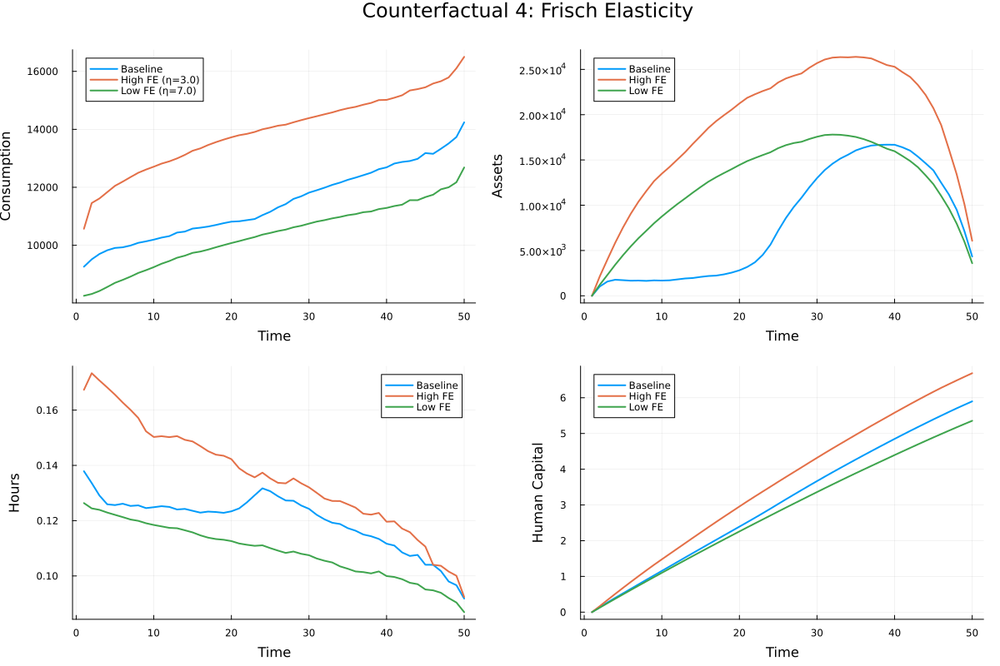

In [41]:
# ----------------------------------------------
# 4. Frisch Elasticity 
# ----------------------------------------------
high_fe = extract_all(model_high_fe)
low_fe = extract_all(model_low_fe)

p9 = plot(t, base.c, label="Baseline", lw=2, xlabel="Time", ylabel="Consumption")
plot!(t, high_fe.c, label="High FE (η=3.0)", lw=2)
plot!(t, low_fe.c, label="Low FE (η=7.0)", lw=2)

p10 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets")
plot!(t, high_fe.a, label="High FE", lw=2)
plot!(t, low_fe.a, label="Low FE", lw=2)

p11 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours")
plot!(t, high_fe.h, label="High FE", lw=2)
plot!(t, low_fe.h, label="Low FE", lw=2)

p12 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(t, high_fe.k, label="High FE", lw=2)
plot!(t, low_fe.k, label="Low FE", lw=2)

plot(p9, p10, p11, p12,
     layout = (2, 2),
     size = (1200, 800),
     plot_title = "Counterfactual 4: Frisch Elasticity",
     titlefont = 16, margin=3mm)

##### Counterfactual 5: **Initial Asset Distribution**

We introduce heterogeneity in initial wealth by drawing from a lognormal distribution.

- **Baseline:** Initial assets = 0  
- **Counterfactual:** Initial assets ∼ LogNormal(μ = 9.4, σ = 0.45; ~90% to fall between 5,000 and 20,000)

> 💡 **Interpretation:**  
> Agents starting with more wealth consume more and work slightly less early in life. Their asset accumulation path is flatter compared to the baseline.

---


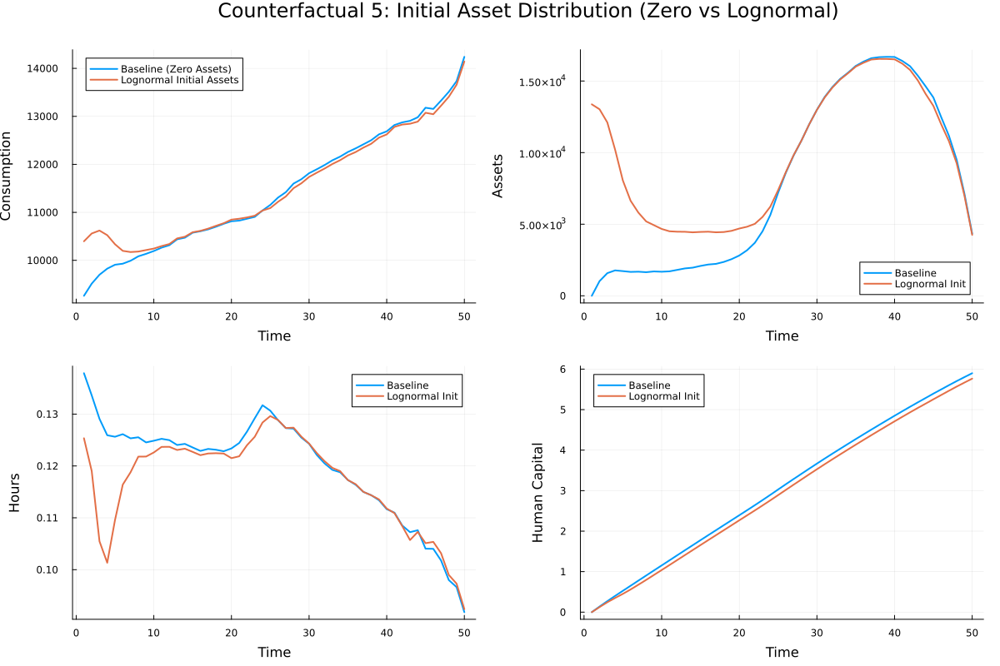

In [42]:
# ----------------------------------------------
# 5. Initial Assets (Baseline vs Lognormal)
# ----------------------------------------------
lognorm = extract_all(model_lognormal)

p13 = plot(t, base.c, label="Baseline (Zero Assets)", lw=2, xlabel="Time", ylabel="Consumption")
plot!(t, lognorm.c, label="Lognormal Initial Assets", lw=2)

p14 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets")
plot!(t, lognorm.a, label="Lognormal Init", lw=2)

p15 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours")
plot!(t, lognorm.h, label="Lognormal Init", lw=2)

p16 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(t, lognorm.k, label="Lognormal Init", lw=2)

plot(p13, p14, p15, p16,
     layout = (2, 2),
     size = (1200, 800),
     plot_title = "Counterfactual 5: Initial Asset Distribution (Zero vs Lognormal)",
     titlefont = 16, margin=3mm)

##### Counterfactual 6: **Retirement Income Reduction**

We simulate a drop in labor income during the later stages of the life cycle to approximate retirement. Specifically, we assume that after period 40, wages fall to 70% of their original level.

- **Baseline:** Constant wage $ w $ throughout life  
- **Retirement Scenario:** $ w_t = 0.7w $ for $ t \geq 40 $

> 💡 **Interpretation:**  
> As wages decline post-retirement, individuals **reduce consumption**, **draw down savings**, and **work fewer hours** if feasible.  
> The model captures lifecycle behavior such as **asset decumulation** and **increased reliance on prior savings** to smooth consumption in retirement.

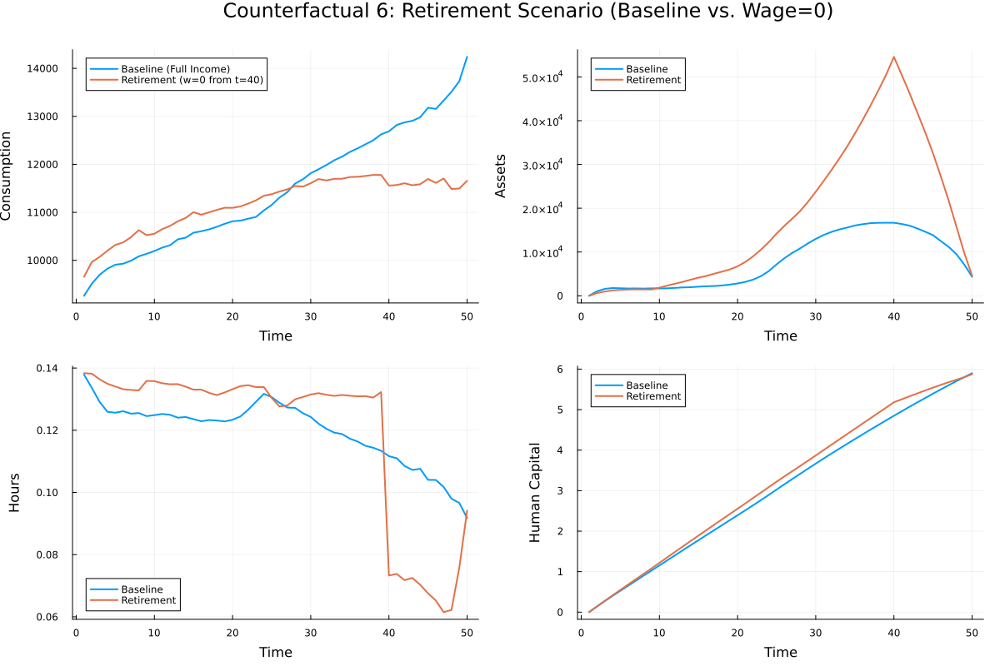

In [43]:
# ----------------------------------------------
# 6. Retirement (Baseline vs Retirement)
# ----------------------------------------------


# Extract simulation data
base   = extract_all(model_baseline)     # Baseline simulation (full income every period)
retire = extract_all(model_retirement)    # Retirement simulation (wage drops to 0 from t = 40)

# Plot Consumption
p13 = plot(t, base.c, label="Baseline (Full Income)", lw=2, xlabel="Time", ylabel="Consumption")
plot!(p13, t, retire.c, label="Retirement (w=0 from t=40)", lw=2)

# Plot Assets
p14 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets")
plot!(p14, t, retire.a, label="Retirement", lw=2)

# Plot Hours
p15 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours")
plot!(p15, t, retire.h, label="Retirement", lw=2)

# Plot Capital
p16 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(p16, t, retire.k, label="Retirement", lw=2)

# Arrange the four plots in a 2x2 grid with a common title and increased size.
plot(p13, p14, p15, p16,
     layout = (2, 2),
     size = (1200, 800),
     plot_title = "Counterfactual 6: Retirement Scenario (Baseline vs. Wage=0)",
     titlefont = 16, margin=3mm)

##### Counterfactual 7: **Interest Rate Variations**

We alter the interest rate $ r $ to understand how the return on savings influences household decisions.

- **Baseline:** $ r = 3\% $  
- **Low r:** $ r = 1\% $  
- **High r:** $ r = 5\% $

> 💡 **Interpretation:**  
> A **higher interest rate** increases the return on saving, encouraging **greater asset accumulation** and potentially **lower labor supply** due to income effects.  
> A **lower interest rate** reduces the incentive to save, leading to **lower wealth** and possibly **higher labor supply** to maintain consumption levels.

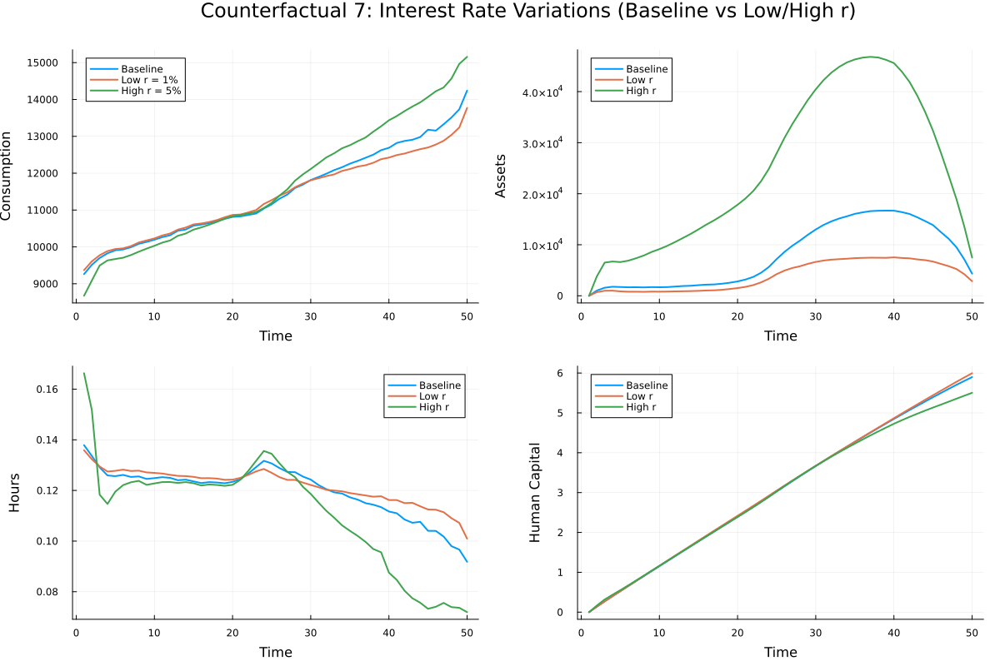

In [44]:
# ----------------------------------------------
# 7. Interest Rate Variations (Low and High r)
# ----------------------------------------------

# Extract simulated series
low_r  = extract_all(model_low_r)
high_r = extract_all(model_high_r)

# Plot: Consumption
pr1 = plot(t, base.c, label="Baseline", lw=2, xlabel="Time", ylabel="Consumption")
plot!(t, low_r.c, label="Low r = 1%", lw=2)
plot!(t, high_r.c, label="High r = 5%", lw=2)

# Plot: Assets
pr2 = plot(t, base.a, label="Baseline", lw=2, xlabel="Time", ylabel="Assets")
plot!(t, low_r.a, label="Low r", lw=2)
plot!(t, high_r.a, label="High r", lw=2)

# Plot: Labor hours
pr3 = plot(t, base.h, label="Baseline", lw=2, xlabel="Time", ylabel="Hours")
plot!(t, low_r.h, label="Low r", lw=2)
plot!(t, high_r.h, label="High r", lw=2)

# Plot: Capital
pr4 = plot(t, base.k, label="Baseline", lw=2, xlabel="Time", ylabel="Human Capital")
plot!(t, low_r.k, label="Low r", lw=2)
plot!(t, high_r.k, label="High r", lw=2)

# Combine plots
plot(pr1, pr2, pr3, pr4,
     layout = (2, 2),
     size = (1200, 800),
     plot_title = "Counterfactual 7: Interest Rate Variations (Baseline vs Low/High r)",
     titlefont = 16, margin=3mm)

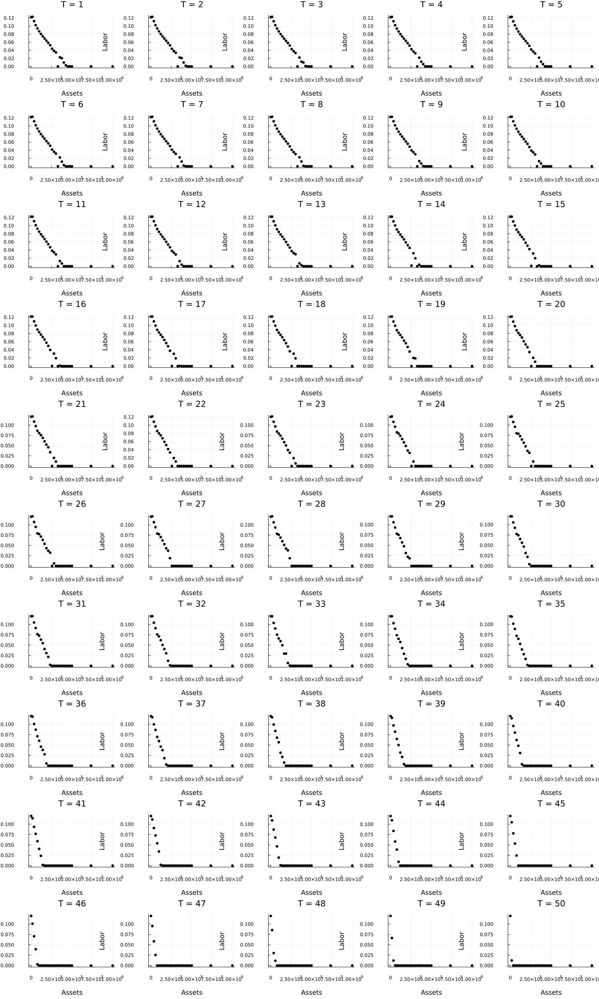

In [19]:
# visiualize the labor supply policy function for all the periods to see how it changes over time
gr()  # or your preferred backend

a_grid = model_baseline.a_grid
sol_h = model_baseline.sol_h
T = model_baseline.T
k_mid = Int(ceil(length(model_baseline.k_grid) / 2))
t_mid = Int(ceil(length(model_baseline.t_grid)/2))  # pick a representative labor/skill state

plots = []

for t in 1:T
    p = scatter(a_grid, sol_h[t, :, k_mid, t_mid],
        title = "T = $t",
        xlabel = "Assets",
        ylabel = "Labor",
        label = false,
        markersize = 2)
    push!(plots, p)
end

# Layout: adjust number of columns depending on how many you want per row
ncols = 5
plot(plots..., layout = (ceil(Int, T / ncols), ncols), size = (300 * ncols, 250 * ceil(Int, T / ncols)))